# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages, which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission if necessary. 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission. 

In addition to implementing code, there is a writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) that can be used to guide the writing process. Completing the code template and writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/481/view) for this project.

The [rubric](https://review.udacity.com/#!/rubrics/481/view) contains "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. The stand out suggestions are optional. If you decide to pursue the "stand out suggestions", you can include the code in this Ipython notebook and also discuss the results in the writeup file.


>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

def load_data():
    
    training_file   = 'train.p'
    validation_file = 'valid.p'
    testing_file    = 'test.p'

    with open(training_file, mode='rb') as f:
        train = pickle.load(f)
    with open(validation_file, mode='rb') as f:
        valid = pickle.load(f)
    with open(testing_file, mode='rb') as f:
        test = pickle.load(f)

    X_train, y_train = train['features'], train['labels']
    X_valid, y_valid = valid['features'], valid['labels']
    X_test,  y_test  = test['features'], test['labels']
    
    return(train, valid, test)

# Load original data
otrain, ovalid, otest = load_data()

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below. Use python, numpy and/or pandas methods to calculate the data summary rather than hard coding the results. For example, the [pandas shape method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html) might be useful for calculating some of the summary results. 

### Provide a Basic Summary of the Data Set Using Python, Numpy and/or Pandas

In [2]:
### Replace each question mark with the appropriate value. 
### Use python, pandas or numpy methods rather than hard coding the results
import numpy as np

def basic_summary(train, valid, test):
    # Measure the tables
    n_train = train['features'].shape[0]
    n_valid = valid['features'].shape[0]
    n_test  = test['features'].shape[0]

    # Measure a single image
    image_shape = train['features'].shape[1:3]

    # Count unique labels over the entire dataset
    n_classes = len(np.unique(np.hstack((train['labels'],valid['labels'],test['labels']))))

    print("Number of training examples =", n_train)
    print("Number of validation examples =", n_valid)
    print("Number of testing examples =", n_test)

    print("Image data shape =", image_shape)
    print("Number of classes =", n_classes)
    
basic_summary(otrain, ovalid, otest)


Number of training examples = 34799
Number of validation examples = 4410
Number of testing examples = 12630
Image data shape = (32, 32)
Number of classes = 43


### Include an exploratory visualization of the dataset

Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc. 

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections. It can be interesting to look at the distribution of classes in the training, validation and test set. Is the distribution the same? Are there more examples of some classes than others?

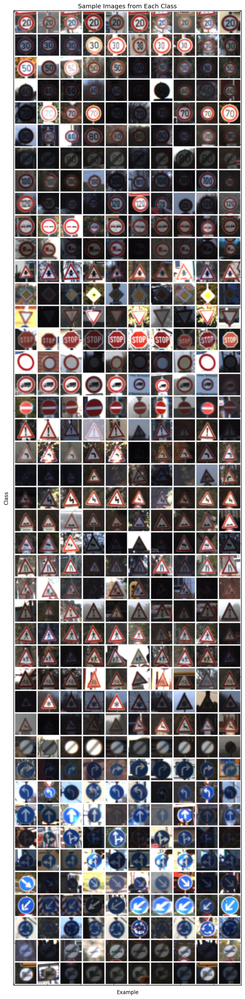

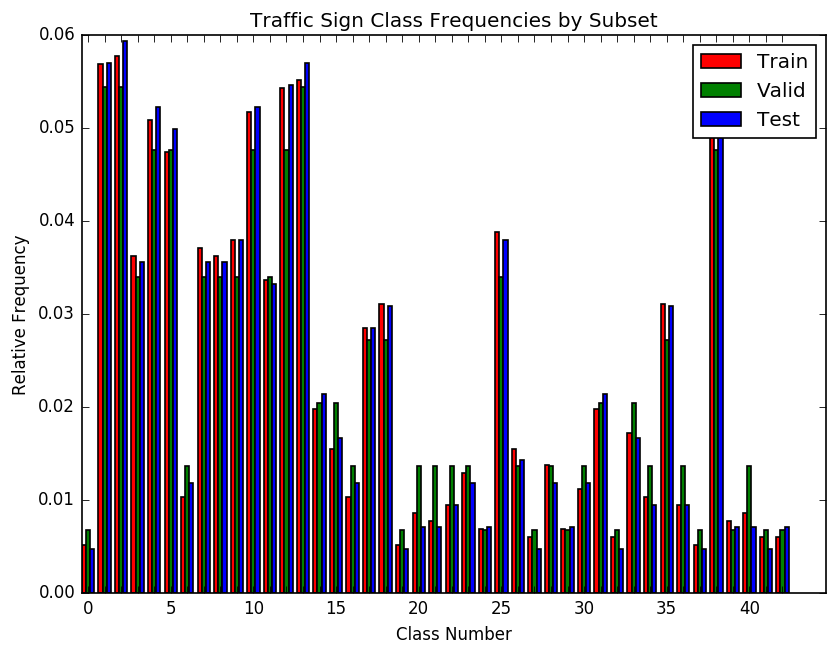

In [3]:
import matplotlib.pyplot as plt

# Visualizations will be shown in the notebook.
% matplotlib inline

# *** Visualize the dataset ***
# Assemble a single large image in which there are 10 columns and one row
# per image class. Each row contains 10 randomly selected images from 
# the corresponding image class.

def visualize_classes(x, filename, ncols=10, bordersize = 2):

    # Set one row per image class
    nrows = len(np.unique(x['labels']))

    # Get image size
    img_y, img_x = x['features'].shape[1:3]

    # Construct the output image
    grid = np.zeros((nrows*(img_x+bordersize)+bordersize,ncols*(img_y+bordersize)+bordersize,3), dtype=np.uint8)

    # Set all pizels to white
    grid[:] = 255

    # Reset the y offset counter
    yoffset = bordersize

    # For each row...
    for row in range(nrows):

        # Find the indices of images whose labels correspond to this output row
        rowimages = np.squeeze(np.where(x['labels']==row))

        # Randomly permute the list so we can easily choose without replacement
        randomized = rowimages[np.random.permutation(len(rowimages))]

        # Clear the x offset counter
        xoffset = bordersize

        # For each column...
        for col in range(ncols):

            # Copy a random training image into the output image
            grid[yoffset:yoffset+img_y,xoffset:xoffset+img_x,:] = x['features'][randomized[col]]

            # Adjust offset for the next column
            xoffset += img_x+bordersize

        # Adjust offset for the next row
        yoffset += img_y+bordersize

    # Create and show the image - hard coding isotropic about 8 inches wide on a 120 dpi display
    fig, ax = plt.subplots(figsize=(8, 8*nrows/ncols), dpi=120)
    plt.imshow(grid)
    plt.title('Sample Images from Each Class')
    ax.set_ylabel('Class')
    ax.set_xlabel('Example')

    # Turn off tick labels
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    plt.savefig(filename)
    plt.show()

# *** Construct a comparative histogram for each data file based on the fraction of images in each class ***
def visualize_histogram(train, valid, test, filename):
    
    # Count unique labels over the entire dataset
    n_classes = len(np.unique(np.hstack((train['labels'],valid['labels'],test['labels']))))

    # Set x locations for the bar groups
    ind = np.arange(n_classes)

    # Set the bar width
    width = 0.25       

    # Crate a figure
    fig, ax = plt.subplots(figsize=(8, 6), dpi=120)

    # Clear bar offset
    offset = 0

    # For each partition...
    for d, c in zip((train, valid, test),('r','g','b')):

        # Create a vector to hold the class histogram
        h = np.zeros((n_classes,1))

        # For each class...    
        for l in range(n_classes):

            # Count fraction of data elements in the class
            h[l] = np.sum(d['labels']==l)/len(d['labels'])

        # Plot bar group for this partition
        ax.bar(ind+offset, h, width, color=c)

        # Increment x offset for next bar group
        offset += width

    # Annotate the plot
    ax.set_title('Traffic Sign Class Frequencies by Subset')
    ax.set_ylabel('Relative Frequency')
    ax.set_xlabel('Class Number')
    ax.set_xticks(ind + 1.5*width)
    ax.set_xticklabels((str(n) if n%5 ==0 else '' for n in range(n_classes)))
    ax.legend(('Train', 'Valid', 'Test'))

    # Show the plot
    plt.savefig(filename)    
    plt.show()

visualize_classes(otrain, filename='images/Vis1.png')
visualize_histogram(otrain, ovalid, otest, filename='images/Vis2.png')

----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play! 

With the LeNet-5 solution from the lecture, you should expect a validation set accuracy of about 0.89. To meet specifications, the validation set accuracy will need to be at least 0.93. It is possible to get an even higher accuracy, but 0.93 is the minimum for a successful project submission. 

There are various aspects to consider when thinking about this problem:

- Neural network architecture (is the network over or underfitting?)
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

### Pre-process the Data Set (normalization, grayscale, etc.)

Minimally, the image data should be normalized so that the data has mean zero and equal variance. For image data, `(pixel - 128)/ 128` is a quick way to approximately normalize the data and can be used in this project. 

Other pre-processing steps are optional. You can try different techniques to see if it improves performance. 

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project.

Augmenting image 0
Augmenting image 500
Augmenting image 1000
Augmenting image 1500
Augmenting image 2000
Augmenting image 2500
Augmenting image 3000
Augmenting image 3500
Augmenting image 4000
Augmenting image 4500
Augmenting image 5000
Augmenting image 5500
Augmenting image 6000
Augmenting image 6500
Augmenting image 7000
Augmenting image 7500
Augmenting image 8000
Augmenting image 8500
Augmenting image 9000
Augmenting image 9500
Augmenting image 10000
Augmenting image 10500
Augmenting image 11000
Augmenting image 11500
Augmenting image 12000
Augmenting image 12500
Augmenting image 13000
Augmenting image 13500
Augmenting image 14000
Augmenting image 14500
Augmenting image 15000
Augmenting image 15500
Augmenting image 16000
Augmenting image 16500
Augmenting image 17000
Augmenting image 17500
Augmenting image 18000
Augmenting image 18500
Augmenting image 19000
Augmenting image 19500
Augmenting image 20000
Augmenting image 20500
Augmenting image 21000
Augmenting image 21500
Augmenting i

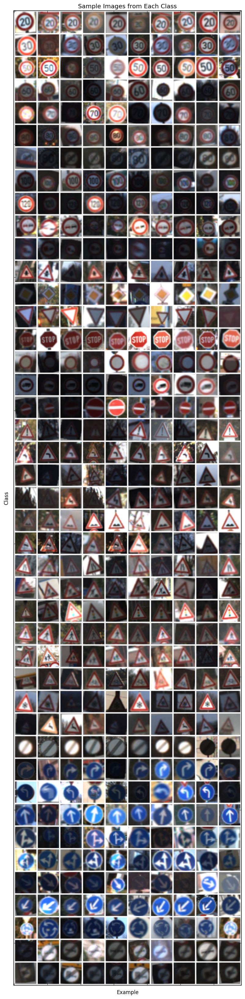

In [4]:
import skimage.transform as sitform
import cv2
    
def standardize_data(train, valid, test):
    
    ### Standardize the data  
    
    # Make copies to avoid modifying the original
    train = train.copy()
    valid = valid.copy()
    test  = test.copy()
    
    # Stack training and validation into one array
    pile = np.hstack((train['features'].flatten(), valid['features'].flatten()))

    # For each data set partition...
    for d in (train, valid, test):   

        # Store the standardized data as x
        d['features'] = (d['features']-128.0)/128
        
    return(train, valid, test)

def augment_data(data, aug=4, max_angle=15, max_pixel=2, max_scale=1.2):

    ### Augment the training data
    
    # Make duplicate so we can avoid modifying the original
    data = data.copy()

    # Clear output image index
    l = 0

    # Get the partition shape
    s = data['features'].shape

    # Create shape for new numpy array
    snew = (aug*s[0],) + s[1:]

    # Make numpy array for output images
    x = np.zeros(snew, dtype=np.float32)

    # Make numpy array for output labels
    y = np.zeros(aug*s[0],dtype=np.int32)

    # For each input image...
    for i in range(data['features'].shape[0]):
        
        if i%500 == 0:
            print('Augmenting image {0}'.format(i))        

        # Copy the input image as an output image
        x[l,:,:,:] = data['features'][i,:,:,:].copy()

        # Copy the input image label as an output image label
        y[l] = data['labels'][i]

        # Increment the ouptut image index
        l += 1

        # For each augmented replica...
        for k in range(1,aug):
            
            # Create a random angle (degrees)
            angle = np.random.uniform(-max_angle, max_angle)

            # Rotate the image
            image = sitform.rotate(data['features'][i],angle)            

            # Create a random translation
            xlat = (np.random.uniform(-max_pixel,max_pixel),np.random.uniform(-max_pixel,max_pixel))
            
            # Create a random scale 
            scale_x = np.random.uniform(1.0, max_scale)
            
            if False:
                
                # Scale anisotropically
                scale_y = np.random.uniform(1.0, max_scale)
                
            else:
                
                # Scale isotropically
                scale_y = scale_x
            
            # Translate the image
            tform = sitform.SimilarityTransform(translation=xlat)
            image = sitform.warp(image,tform.inverse)

            # Scale the image
            sc_y, sc_x = image.shape[:2]
            sc_x = int(sc_x*scale_x)
            sc_y = int(sc_y*scale_y)
            off_x = (sc_x-32)//2
            off_y = (sc_y-32)//2
            
            # Make image bigger
            big = cv2.resize(image, (sc_x, sc_y), interpolation=cv2.INTER_CUBIC)
            
            # Crop to the center
            image = big[off_y:off_y+32,off_x:off_x+32,:]

            # Save the modified image
            x[l,:,:,:] = image

            # Save the corresponding label
            y[l] = data['labels'][i]

            # Increment the output image counter
            l += 1

    # Save augmented data and labels
    data['features'] = x
    data['labels'] = y
    
    return(data)   

train, valid, test = standardize_data(otrain, ovalid, otest)
train = augment_data(train)

tmp = train.copy()
tmp['features'] = tmp['features'].copy()*128+128
tmp['features'] = np.minimum(np.maximum(tmp['features'],0),255)
visualize_classes(tmp, filename='images/Aug1.png')

### Model Architecture

In [5]:
import math
import tensorflow as tf
from tensorflow.contrib.layers import flatten

def model(x, keep_prob=1):    
        
    # Convolution -> ELU - pool
    n1 = 24
    sigma1 = 2/math.sqrt(5*5*3+n1)
    conv1_W = tf.Variable(tf.truncated_normal(shape=(5, 5, 3, n1), stddev = sigma1))
    conv1_b = tf.Variable(tf.zeros(n1))
    conv1   = tf.nn.conv2d(x, conv1_W, strides=[1, 1, 1, 1], padding='VALID') + conv1_b
    conv1   = tf.nn.elu(conv1)
    conv1   = tf.nn.max_pool(conv1, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    # Convolution -> ELU - pool
    n2 = 64
    sigma2 = 2/math.sqrt(5*5*n1+n2)
    conv2_W = tf.Variable(tf.truncated_normal(shape=(5, 5, n1, n2), stddev = sigma2))
    conv2_b = tf.Variable(tf.zeros(n2))
    conv2   = tf.nn.conv2d(conv1, conv2_W, strides=[1, 1, 1, 1], padding='VALID') + conv2_b
    conv2   = tf.nn.elu(conv2)
    conv2   = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='VALID')

    # Flatten -> dropout
    fc0   = flatten(conv2)
    fc0   = tf.nn.dropout(fc0, keep_prob=keep_prob)
    
    # Parameter to scale up fully connected layers
    w = 2
    
    # Fully connected -> ELU -> dropout
    sigma_fc1 = 2/math.sqrt(1600+w*400)
    fc1_W = tf.Variable(tf.truncated_normal(shape=(1600, w*400), stddev = sigma_fc1))
    fc1_b = tf.Variable(tf.zeros(w*400))
    fc1   = tf.matmul(fc0, fc1_W) + fc1_b
    fc1   = tf.nn.elu(fc1)
    fc1   = tf.nn.dropout(fc1, keep_prob=keep_prob)
    
    # Fully connected -> ELU -> dropout
    sigma_fc1a = 2/math.sqrt(w*400+w*400)
    fc1a_W = tf.Variable(tf.truncated_normal(shape=(w*400, w*400), stddev = sigma_fc1a))
    fc1a_b = tf.Variable(tf.zeros(w*400))
    fc1a   = tf.matmul(fc1, fc1a_W) + fc1a_b
    fc1a    = tf.nn.elu(fc1a)
    fc1a   = tf.nn.dropout(fc1a, keep_prob=keep_prob)

    # Fully connected -> ELU -> dropout
    sigma_fc2 = 2/math.sqrt(w*400+w*200)
    fc2_W  = tf.Variable(tf.truncated_normal(shape=(w*400, w*200), stddev = sigma_fc2))
    fc2_b  = tf.Variable(tf.zeros(w*200))
    fc2    = tf.matmul(fc1a, fc2_W) + fc2_b
    fc2   = tf.nn.elu(fc2)
    fc2   = tf.nn.dropout(fc2, keep_prob=keep_prob)
    
    # Fully connected -> ELU 
    sigma_fc2a = 2/math.sqrt(w*200+w*200)
    fc2a_W  = tf.Variable(tf.truncated_normal(shape=(w*200, w*200), stddev = sigma_fc2a))
    fc2a_b  = tf.Variable(tf.zeros(w*200))
    fc2a    = tf.matmul(fc2, fc2a_W) + fc2a_b
    fc2a    = tf.nn.elu(fc2a)
    #fc2a    = tf.nn.dropout(fc2a, keep_prob=keep_prob)

    # Fully connected -> 
    sigma_fc3 = 2/math.sqrt(w*200+43)
    fc3_W  = tf.Variable(tf.truncated_normal(shape=(w*200, 43), stddev = sigma_fc3))
    fc3_b  = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2a, fc3_W) + fc3_b
    
    return logits

### Train, Validate and Test the Model

A validation set can be used to assess how well the model is performing. A low accuracy on the training and validation
sets imply underfitting. A high accuracy on the training set but low accuracy on the validation set implies overfitting.

In [6]:
from sklearn.utils import shuffle

# Hyperparameters
rate   = 0.0005
EPOCHS = 20
BATCH_SIZE = [128, 2048]

# Count unique labels over the entire dataset
n_classes = len(np.unique(np.hstack((train['labels'],valid['labels'],test['labels']))))

# Clear graph space 
tf.reset_default_graph()

# Build training graph
x = tf.placeholder(tf.float32, (None, 32, 32, 3))
y = tf.placeholder(tf.int32, (None))
keep_prob = tf.placeholder(tf.float32)
one_hot_y = tf.one_hot(y, n_classes)

logits = model(x, keep_prob)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(labels=one_hot_y, logits=logits)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(X_data, y_data):      
    batch_size = 2048
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, batch_size):
        batch_x, batch_y = X_data[offset:offset+batch_size], y_data[offset:offset+batch_size]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 1})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy / num_examples

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(train['features'])
    
    print("Training...")
    print()
    for i in range(EPOCHS):
        X_train, y_train = shuffle(train['features'], train['labels'])
        print(X_train.shape)
        batch_size = BATCH_SIZE[i>10]
                
        for offset in range(0, num_examples, batch_size):
            end = offset + batch_size
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob: 0.5})
            
        train_accuracy      = evaluate(train['features'], train['labels'])
        validation_accuracy = evaluate(valid['features'], valid['labels'])
        print("EPOCH {} ...".format(i+1))
        print("Train Accuracy = {:.3f}".format(train_accuracy))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    saver.save(sess, './model')
    print("Model saved")

Training...

(139196, 32, 32, 3)
EPOCH 1 ...
Train Accuracy = 0.908
Validation Accuracy = 0.887

(139196, 32, 32, 3)
EPOCH 2 ...
Train Accuracy = 0.953
Validation Accuracy = 0.939

(139196, 32, 32, 3)
EPOCH 3 ...
Train Accuracy = 0.970
Validation Accuracy = 0.939

(139196, 32, 32, 3)
EPOCH 4 ...
Train Accuracy = 0.975
Validation Accuracy = 0.950

(139196, 32, 32, 3)
EPOCH 5 ...
Train Accuracy = 0.985
Validation Accuracy = 0.964

(139196, 32, 32, 3)
EPOCH 6 ...
Train Accuracy = 0.988
Validation Accuracy = 0.969

(139196, 32, 32, 3)
EPOCH 7 ...
Train Accuracy = 0.989
Validation Accuracy = 0.967

(139196, 32, 32, 3)
EPOCH 8 ...
Train Accuracy = 0.993
Validation Accuracy = 0.973

(139196, 32, 32, 3)
EPOCH 9 ...
Train Accuracy = 0.992
Validation Accuracy = 0.971

(139196, 32, 32, 3)
EPOCH 10 ...
Train Accuracy = 0.994
Validation Accuracy = 0.973

(139196, 32, 32, 3)
EPOCH 11 ...
Train Accuracy = 0.995
Validation Accuracy = 0.966

(139196, 32, 32, 3)
EPOCH 12 ...
Train Accuracy = 0.997
Valid

In [7]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(test['features'], test['labels'])
    print("Test Accuracy = {:.3f}".format(test_accuracy))

INFO:tensorflow:Restoring parameters from ./model
Test Accuracy = 0.967


---

## Step 3: Test a Model on New Images

To give yourself more insight into how your model is working, download at least five pictures of German traffic signs from the web and use your model to predict the traffic sign type.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Load and Output the Images

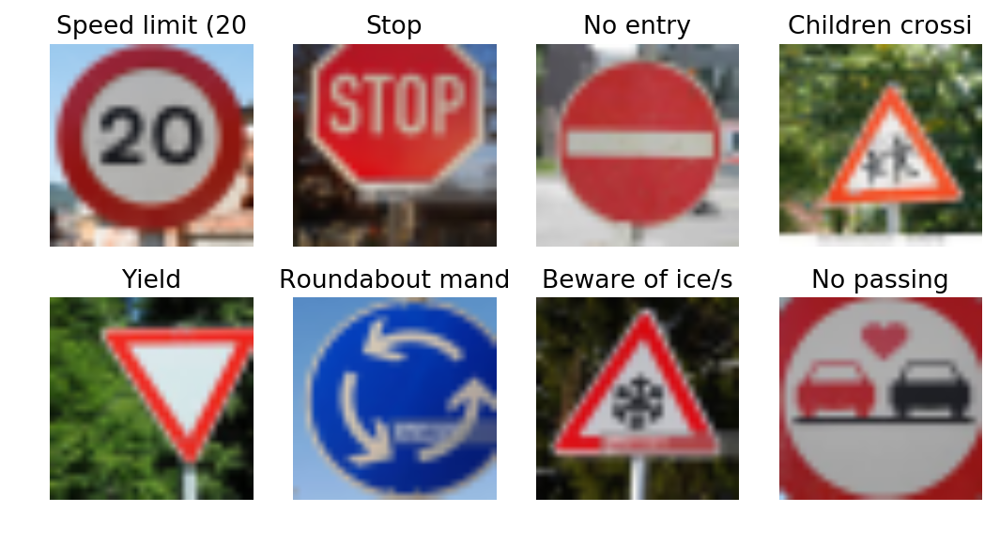

In [9]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.

#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

%matplotlib inline

# Get filenames from images directory
testdir = 'images'

# Force alphabetical ordering
names = ['Image1.jpg', 'Image2.jpg', 'Image3.jpg', 'Image4.jpg', 'Image5.jpg', 'Image6.jpg', 'Image7.jpg', 'Image8.jpg']

oextras = {}
oextras['features'] = np.zeros((len(names), 32, 32, 3))
oextras['labels']   = np.array([0, 14, 17, 28, 13, 40, 30, 9], dtype=np.int32)

k = 0
for name in names:

    orig  = mpimg.imread(testdir + '/' + name)
    crop = orig.copy()
    orig_y, orig_x = orig.shape[:2]
    if orig_x > orig_y:
        n = (orig_x-orig_y)//2
        crop = orig[:,n:n+orig_y,:]
    else:
        n = (orig_y-orig_x)//2
        crop = orig[n:n+orig_x,:,:]
        
    small = cv2.resize(crop, (32, 32), interpolation = cv2.INTER_AREA) 

    oextras['features'][k] = small
    k += 1

extras = oextras.copy()
extras['features'] = (extras['features']-128.0)/128

class_file = "signnames.csv"
with open (class_file, "r") as myfile:
    class_names = myfile.readlines()  
class_names = [x.strip().split(',')[1:] for x in class_names]
class_names.pop(0)

fig, ax = plt.subplots(2, 4, figsize=(8, 4), dpi=160, facecolor='w', edgecolor='k')
for k in range(len(extras['features'])):

    row, col = k//4, k%4
    ax[row, col].imshow(np.uint8(extras['features'][k]*128.0+128))
    ax[row, col].axis('off')
    ax[row, col].set_title(class_names[extras['labels'][k]][0][0:15])
    
plt.savefig('images/Signs.png')

### Predict the Sign Type for Each Image

INFO:tensorflow:Restoring parameters from ./model


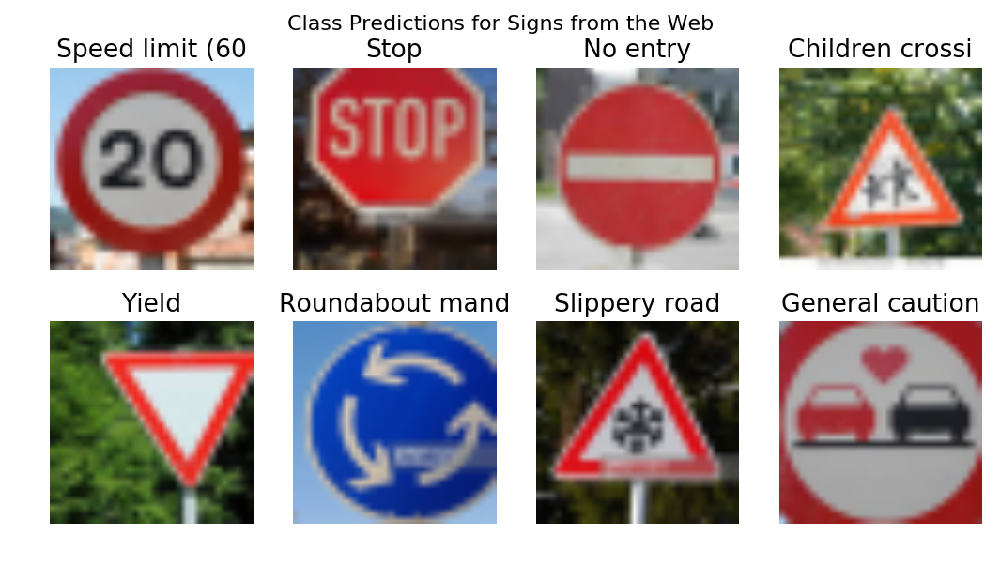

In [10]:
### Run the predictions here and use the model to output the prediction for each image.
### Make sure to pre-process the images with the same pre-processing pipeline used earlier.
### Feel free to use as many code cells as needed.

class_file = "signnames.csv"
with open (class_file, "r") as myfile:
    class_names = myfile.readlines()  
class_names = [x.strip().split(',')[1:] for x in class_names]
class_names.pop(0)
    
with tf.Session() as sess:
  
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    pred = sess.run(tf.argmax(logits, 1), feed_dict={x: extras['features'], keep_prob: 1})

    fig, ax = plt.subplots(2, 4, figsize=(8, 4), dpi=160, facecolor='w', edgecolor='k')
    plt.suptitle('Class Predictions for Signs from the Web')
    for k in range(len(pred)):
        row, col = k//4, k % 4
        ax[row, col].imshow(np.uint8(extras['features'][k]*128.0+128))
        ax[row, col].axis('off')
        ax[row, col].set_title(class_names[pred[k]][0][0:15])    
        
    plt.savefig('images/Predictions.png')


### Analyze Performance

In [11]:
### Calculate the accuracy for these 5 new images. 
### For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate on these new images.

with tf.Session() as sess:
  
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    accuracy = sess.run(accuracy_operation, feed_dict={x: extras['features'], y: extras['labels'], keep_prob: 1})
    
print('Classification accuracy on web images is {0}.'.format(accuracy))

INFO:tensorflow:Restoring parameters from ./model
Classification accuracy on web images is 0.625.


### Output Top 5 Softmax Probabilities For Each Image Found on the Web

For each of the new images, print out the model's softmax probabilities to show the **certainty** of the model's predictions (limit the output to the top 5 probabilities for each image). [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. 

The example below demonstrates how tf.nn.top_k can be used to find the top k predictions for each image.

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example. The values in the array represent predictions. The array contains softmax probabilities for five candidate images with six possible classes. `tf.nn.top_k` is used to choose the three classes with the highest probability:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

In [13]:
### Print out the top five softmax probabilities for the predictions on the German traffic sign images found on the web. 
### Feel free to use as many code cells as needed.

class_file = "signnames.csv"
with open (class_file, "r") as myfile:
    class_names = myfile.readlines()  
class_names = [x.strip().split(',')[1:] for x in class_names]
class_names.pop(0)

probs_op = tf.nn.softmax(logits)

topn = 5
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    values, indices = sess.run(tf.nn.top_k(probs_op, k=topn), feed_dict={x: extras['features'], keep_prob: 1}) 

    m = len(extras['labels'])

    for k in range(m):
        print()
        print('Actual Class = {0}'.format(class_names[extras['labels'][k]][0]))
        for l in range(topn):
            print('  {2} Probability = {0:.4f}, Classname = {1}'.format((values[k,l]),class_names[indices[k,l]][0],l+1))      

INFO:tensorflow:Restoring parameters from ./model

Actual Class = Speed limit (20km/h)
  1 Probability = 0.8760, Classname = Speed limit (60km/h)
  2 Probability = 0.0736, Classname = Speed limit (30km/h)
  3 Probability = 0.0303, Classname = Speed limit (20km/h)
  4 Probability = 0.0153, Classname = Speed limit (80km/h)
  5 Probability = 0.0023, Classname = Speed limit (120km/h)

Actual Class = Stop
  1 Probability = 0.7502, Classname = Stop
  2 Probability = 0.2464, Classname = Priority road
  3 Probability = 0.0029, Classname = No entry
  4 Probability = 0.0003, Classname = No passing for vehicles over 3.5 metric tons
  5 Probability = 0.0001, Classname = Speed limit (80km/h)

Actual Class = No entry
  1 Probability = 1.0000, Classname = No entry
  2 Probability = 0.0000, Classname = Speed limit (20km/h)
  3 Probability = 0.0000, Classname = Speed limit (30km/h)
  4 Probability = 0.0000, Classname = Speed limit (50km/h)
  5 Probability = 0.0000, Classname = Speed limit (60km/h)

Act

### Project Writeup

Once you have completed the code implementation, document your results in a project writeup using this [template](https://github.com/udacity/CarND-Traffic-Sign-Classifier-Project/blob/master/writeup_template.md) as a guide. The writeup can be in a markdown or pdf file. 

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

---

## Step 4 (Optional): Visualize the Neural Network's State with Test Images

 This Section is not required to complete but acts as an additional excersise for understaning the output of a neural network's weights. While neural networks can be a great learning device they are often referred to as a black box. We can understand what the weights of a neural network look like better by plotting their feature maps. After successfully training your neural network you can see what it's feature maps look like by plotting the output of the network's weight layers in response to a test stimuli image. From these plotted feature maps, it's possible to see what characteristics of an image the network finds interesting. For a sign, maybe the inner network feature maps react with high activation to the sign's boundary outline or to the contrast in the sign's painted symbol.

 Provided for you below is the function code that allows you to get the visualization output of any tensorflow weight layer you want. The inputs to the function should be a stimuli image, one used during training or a new one you provided, and then the tensorflow variable name that represents the layer's state during the training process, for instance if you wanted to see what the [LeNet lab's](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) feature maps looked like for it's second convolutional layer you could enter conv2 as the tf_activation variable.

For an example of what feature map outputs look like, check out NVIDIA's results in their paper [End-to-End Deep Learning for Self-Driving Cars](https://devblogs.nvidia.com/parallelforall/deep-learning-self-driving-cars/) in the section Visualization of internal CNN State. NVIDIA was able to show that their network's inner weights had high activations to road boundary lines by comparing feature maps from an image with a clear path to one without. Try experimenting with a similar test to show that your trained network's weights are looking for interesting features, whether it's looking at differences in feature maps from images with or without a sign, or even what feature maps look like in a trained network vs a completely untrained one on the same sign image.

<figure>
 <img src="visualize_cnn.png" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above)</p> 
 </figcaption>
</figure>
 <p></p> 


In [ ]:
### Visualize your network's feature maps here.
### Feel free to use as many code cells as needed.

# image_input: the test image being fed into the network to produce the feature maps
# tf_activation: should be a tf variable name used during your training procedure that represents the calculated state of a specific weight layer
# activation_min/max: can be used to view the activation contrast in more detail, by default matplot sets min and max to the actual min and max values of the output
# plt_num: used to plot out multiple different weight feature map sets on the same block, just extend the plt number for each new feature map entry

def outputFeatureMap(image_input, tf_activation, activation_min=-1, activation_max=-1 ,plt_num=1):
    # Here make sure to preprocess your image_input in a way your network expects
    # with size, normalization, ect if needed
    # image_input =
    # Note: x should be the same name as your network's tensorflow data placeholder variable
    # If you get an error tf_activation is not defined it may be having trouble accessing the variable from inside a function
    activation = tf_activation.eval(session=sess,feed_dict={x : image_input})
    featuremaps = activation.shape[3]
    plt.figure(plt_num, figsize=(15,15))
    for featuremap in range(featuremaps):
        plt.subplot(6,8, featuremap+1) # sets the number of feature maps to show on each row and column
        plt.title('FeatureMap ' + str(featuremap)) # displays the feature map number
        if activation_min != -1 & activation_max != -1:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", vmin =activation_min, vmax=activation_max, cmap="gray")
        elif activation_max != -1:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", vmax=activation_max, cmap="gray")
        elif activation_min !=-1:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", vmin=activation_min, cmap="gray")
        else:
            plt.imshow(activation[0,:,:, featuremap], interpolation="nearest", cmap="gray")

# The following cell contains the project writeup.

# Build a Traffic Sign Recognition Project

The goals / steps of this project are the following:
* Load the data set (see below for links to the project data set)
* Explore, summarize and visualize the data set
* Design, train and test a model architecture
* Use the model to make predictions on new images
* Analyze the softmax probabilities of the new images
* Summarize the results with a written report

# Rubric Points
Here I will consider the [rubric points](https://review.udacity.com/#!/rubrics/481/view) individually and describe how I addressed each point in my implementation.  

## Writeup / README

You're reading it! and here is a link to my [project](https://github.com/gloudemans/CarND-Traffic-Sign-Classifier-Project)

## Data Set Summary & Exploration

### 1. Provide a basic summary of the data set.

The German Traffic Signs data set is a labeled data set of German traffic sign images. Each image is 32x32x3 pixels (32x32 RGB color) and has an integer class identifier ranging from 0 to 42 (43 classes). There is a .csv file naming each integer class. The data set is provided in three files corresponding to predefined training, validation and test splits with the following sizes:

* Number of training examples = 34799
* Number of validation examples = 4410
* Number of testing examples = 12630
* The shape of a traffic sign image is 32x32
* The number of unique classes / labels in the data set is 43

### 2. Include an exploratory visualization of the dataset.

To visualize the data I constructed a plot in which each of 43 rows contains 10 images of signs from a particular class. This visualization provided a quick sanity check to confirm that the data was loading as expected, and it revealed the relatively poor quality of the images. Many of the images are blurry and poorly lighted so that classifying them would be error prone even for a human.

![Class Examples](images/Vis1.png)

I also constructued a bar chart comparing the relative rates of occurrences for image class instances in the training, validation, and test sets. The chart reveals that the distribution of individual image instances varies significantly by class but is relatively consistent between the training, validation and test splits. The consistency between splits is desirable as it indicates the training and test data have somewhat similar characteristics.

![Comparative Histogram](images/Vis2.png)

## Design and Test a Model Architecture

### 1. Describe how you preprocessed the image data.

I standardized the data using the simple (x-128)/128 strategy suggested in the project description. Normalizing the data to zero mean and unit variance is standard practice for machine learning systems and generally improves their performance by holding the dynamic range of values in a range for which the algorithms are optimized, avoiding ill-conditioning, and other mechanisms. The strategy described above achieves approximate normalization.

I also experimented with data augmentation of the training image split with the intent of improving generalization performance of the model. For each training image, I augmented the data set with three additional images having random rotation over the range -15 to 15 degrees, random translation over the range -2 to 2 pixels, and random scaling by facgtors between 1.0 and 1.3. The rotation and translation limits were based on the augmentation approach described in the referenced paper by Yann LeCun. I found that the model generally trained more slowly with the augmented data but that the gap between train set performance and validation set performance was much reduced when training with the augmented data. Overall, my best test scores of ~0.97 were acheived while training with augmented data, and validation scores of ~0.975+ we're routinely observed. The figure below illustrates the augmented training data.

![Augmented Images](images/Aug1.png)

### 2. Describe what your final model architecture looks like including model type, layers, layer sizes, connectivity, etc.

I started with the LeNet convolutional architecture and modified it in the following ways:

* Increased most layer dimensions to increase model capacity
* Changed relu to elu activation functions to guard against dead units
* Added dropout layers to improve regularization and reduce overfitting given greater model capacity
* Changed to Xavier weight initialization to provide improved bidirectional information flow during training
* Added fully connected layers to increase depth and model capacity

My final model consisted of the following layers:

| Layer           |                                             Description	                				 	 | 
|:---------------:|:--------------------------------------------------------------------------------------------:| 
| Convolution 2d  | input=[32,32,3],  output=[28,28,24], kernel = [5,5,3,24],  strides=[1,1,1,1], activation=elu |
| Maxpool         | input=[28,28,24], output=[14,14,24], kernel=[1,2,2,1],     strides=[1,2,2,1]                 |
| Convolution 2d  | input=[14,14,24], output=[10,10,64], kernel = [5,5,24,64], strides=[1,1,1,1], activation=elu |
| Maxpool         | input=[10,10,64], output=[5,5,64],   kernel=[1,2,2,1],     strides=[1,2,2,1]                 |
| Flatten         | input=[5,5,64],output=[1600]                                                                 |
| Dropout         | keep = 0.5 (training only)                                                                   |
| Fully Connected | input=[1600], output=[800]                                                                   |
| Dropout         | keep = 0.5 (training only)                                                                   |
| Fully Connected | input=[800], output=[800]                                                                    |
| Dropout         | keep = 0.5 (training only)                                                                   |
| Fully Connected | input=[800], output=[400]                                                                    |
| Dropout         | keep = 0.5 (training only)                                                                   |
| Fully Connected | input=[400], output=[400]                                                                    |
| Dropout         | keep = 0.5 (training only)                                                                   |
| Fully Connected | input=[400], output=[43]                                                                     |

This model has significantly more parameters and computational complexity than the LeNet model from which I derived it. I used the strategy of making the model capable of overlearning the data set and then using dropout and feature augmentation as regularization strategies to combat overfitting and improve generalization. Based on articles I've read and personal experience, this approach often yields good test performance at the expense of computational and parametric efficiency. My final model does perform reasonably well, but it is not well optimized for efficiency as might be required for a real-time embedded vehicular application.

I experimented with the number and placement of the dropout layers and found the best performance was somewhat related to the model capacity with large model capacity requiring additional dropout layers. Droput applied in the convolutional layers did not produce good results, and this is likely because the convolutional layers are in general less prone to overfitting owing to their parametric sparsity. When applying dropout to fully conected layers, it seemed that applying dropout to the initial fully connected layers was most effective and that moving toward the output dropout was progressively less crucial.

### Model Training

I used the Adam optimizer for training the model with a learning rate parameter of 0.0005. Training at learning rates above 0.0005 was sometimes unstable and would cause the model to diverge. I trained the model for 20 epochs, where each epoch included the original training data and three augmented variants for a total of 4 times the original training data per epoch. I used a batch size of 128 samples for the first 10 epochs and 2048 samples thereafter. I used this strategy because the small batch size allowed for very rapid initial convergence, but I found that the small batch size seemed to make validation performance volatile at the later stages of training. This may be due to the somewhat aggressive nature of the Adam optimizer with respect to learning rate. By increasing the batch size during the later training epochs I found the validation performance to be more stable and predictable.

### Solution Approach

I started with the LeNet architecture which is a well-known architecture for image classification. Its performance is somewhat short of the required performance for this project, so I decided to experiment with various changes to see if I could improve it. I began by increasing the dimensions for many of the internal structures to give the model more capacity. This improved performance to a degree, but the model started to exhibit signs of overfitting, so I added dropout layers to improve regularization. I changed the relu units to elu units because I've read that they provide some resistance to the "dead neuron" problem since their gradient is always nonzero. I changed the weight initialization standard deviation and found that this had a large effect on model performance, so I changed to Xavier initialization of the weights because I've read that it is effective in establishing a network through which both forward and backward propagation of information can occur leading to effective training of the network. The Xavier initialization provided layer-specific standard deviation values that worked as well as or better than my hand selected standard deviations, so I retained this modification as well. Based on the recent success of much deeper neural networks, I added layers and found that additional convoutional layers were not helpful but additional fully connected layers improved performance somewhat. I did not see a significant benefit to additional layers beyond the fully connected layers I added. I experimented with the learning rate parameter and found that a value of 0.0005 led to reliable convergence and good performance, while values above 0.0007 sometimes led to training failure. I observed that small batch sizes were much better for initial convergence but led to volatile model behavior in later training stages, so I changed to smaller batch sizes after the first few epochs and found that this made performance of the trainined network less variable. One of the last changes I made was to augment the training data with random rotations, translations, and scalings in order to expose the network to a wider variety of valid training data. The extra data slowed convergence of the network, but it resulted in a somewhat better validation set performance. Networks trained with augmented data also had test set performance that was very close to their validation set performance and performed best overall.  I kept the Adam optimizer throughout as it is generally regarded to yield consistenly good performance.

I experimented with more aggressive data augmentation including large amounts of translation and scaling, and this improved improved performance on classifying images from the web (which had scaling and translation outside the typical examples from the dataset). Unfortunately this improved generalization cam at the cost of decreased accuracy on the actual dataset, so I used more conservative values in my final network.

My final model results were:
* training set accuracy of 0.998
* validation set accuracy of 0.977 
* test set accuracy of 0.967

The high training accuracy might suggest that the model is overfit, but additional interventions to reduce overfitting (reduction of model capacity, early stopping, and an additional dropout layer) did not materially improve validation or test accuracy. The validation accuracy of 0.977 is reasonably good compared to published results, so I think it might take a fairly significant architecture change to significantly improve the results. The test set accuracy of 0.967 is somewhat short of the 0.99+ results published by Yann LeCun and others (Traffic Sign Recognition with Multi-Scale Convolutional Networks), so there is certainly at least some room for improvement.

Next steps might be to implement batch normalization between layers and to incorporate deeper additional layers with skip layer connections as these have been demonstrated to yield excellent performance in some recent image classification competitions. It might also be beneficial to include additional forms of data augmentation and to evaluate color space transformations (for example YUV) as implmented in Yann LeCun's referenced paper. In the convolutional area, 1x1 convolutions might be worth trying.

### Test a Model on New Images

#### Signs from the Web

Here are eight German traffic signs that I found on the web:

![Web Signs](images/Signs.png)

The signs might be diffiuclt to classify because:
* The speed limit 20 sign is somewhat off-center.
* The stop sign is far off-center and heavily cropped.
* The no entry sign doesn't have any obvious difficulties.
* The children crossing sign is somewhat off-center, rotated and not a full frontal view. It is also very similar to other warning signs.
* The yield sign is far off-center.
* The roundabout mandatory sign is large, off-center, and partially cropped.
* The beware of ice sign might be a challenge because the snowflake in the center is the only differentiator between it and other signs like chilren crossing.
* The no passing sign is vary large and severely cropped and has an extra heart painted on it.

#### Performance on New Images

The model classified 5 of the 8 signs correctly for a (lackluster) accuracy of 62.5%. It misclassified the speed limit 20, beware of ice, and no passing signs.

![Web Predictions](images/Predictions.png)

#### Model Certainty

For the speed limit 20km/h sign, the model was 87% sure of its incorrect prediction although the correct class was its third choice. All of the top alternatives were speed limit signs.

Actual Class = Speed limit (20km/h)
1. Probability = 0.8760, Classname = Speed limit (60km/h)
1. Probability = 0.0736, Classname = Speed limit (30km/h)
1. Probability = 0.0303, Classname = Speed limit (20km/h)
1. Probability = 0.0153, Classname = Speed limit (80km/h)
1. Probability = 0.0023, Classname = Speed limit (120km/h)

For the stop sign, the model was 75% sure of its correct prediction, though it considered prioririty road to be a contender at 25%.

Actual Class = Stop
1. Probability = 0.7502, Classname = Stop
1. Probability = 0.2464, Classname = Priority road
1. Probability = 0.0029, Classname = No entry
1. Probability = 0.0003, Classname = No passing for vehicles over 3.5 metric tons
1. Probability = 0.0001, Classname = Speed limit (80km/h)

For the no entry sign, the model was 100% sure of its correct choice.

Actual Class = No entry
1. Probability = 1.0000, Classname = No entry
1. Probability = 0.0000, Classname = Speed limit (20km/h)
1. Probability = 0.0000, Classname = Speed limit (30km/h)
1. Probability = 0.0000, Classname = Speed limit (50km/h)
1. Probability = 0.0000, Classname = Speed limit (60km/h)

For the children crossing sign, the model was 100% sure of its correct choice.

Actual Class = Children crossing
1. Probability = 1.0000, Classname = Children crossing
1. Probability = 0.0000, Classname = Bicycles crossing
1. Probability = 0.0000, Classname = Slippery road
1. Probability = 0.0000, Classname = Right-of-way at the next intersection
1. Probability = 0.0000, Classname = Dangerous curve to the right

For the yield sign, the model was 100% sure of its correct choice.

Actual Class = Yield
1. Probability = 1.0000, Classname = Yield
1. Probability = 0.0000, Classname = Priority road
1. Probability = 0.0000, Classname = Children crossing
1. Probability = 0.0000, Classname = Ahead only
1. Probability = 0.0000, Classname = Speed limit (30km/h)

For the roundabout mandatory sign, the model was 100% sure of its correct choice.

Actual Class = Roundabout mandatory
1. Probability = 1.0000, Classname = Roundabout mandatory
1. Probability = 0.0000, Classname = Keep right
1. Probability = 0.0000, Classname = Turn right ahead
1. Probability = 0.0000, Classname = Ahead only
1. Probability = 0.0000, Classname = Go straight or right

For the beware of ice/snow sign, the model was more conflicted with all five of the alternatives having nontrivial probability weight. The correct choice was not among the top 5 options.

Actual Class = Beware of ice/snow
1. Probability = 0.5819, Classname = Slippery road
1. Probability = 0.1893, Classname = Beware of ice/snow
1. Probability = 0.1554, Classname = Pedestrians
1. Probability = 0.0589, Classname = Right-of-way at the next intersection
1. Probability = 0.0102, Classname = Children crossing

For the no passing sign, the model was fairly confident in its choice of general caution at 91%. Again, it failed to include the correct choice in the top 5 options.

Actual Class = No passing
1. Probability = 0.9145, Classname = General caution
1. Probability = 0.0452, Classname = Right-of-way at the next intersection
1. Probability = 0.0105, Classname = Speed limit (30km/h)
1. Probability = 0.0074, Classname = Slippery road
1. Probability = 0.0060, Classname = Traffic signals

### (Optional) Visualizing the Neural Network
I did not complete the optional exercise.